In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dropout, Flatten, Activation, MaxPooling2D, Dense, BatchNormalization
from matplotlib import pyplot as plt
from matplotlib import image as mimg
from tensorflow.keras.preprocessing import image as img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

In [2]:
!unzip with_mask-20210410T143203Z-001.zip
!unzip without_mask-20210410T143203Z-001.zip

Archive:  with_mask-20210410T143203Z-001.zip
  inflating: with_mask/augmented_image_77.jpg  
  inflating: with_mask/augmented_image_80.jpg  
  inflating: with_mask/augmented_image_69.jpg  
  inflating: with_mask/augmented_image_83.jpg  
  inflating: with_mask/augmented_image_90.jpg  
  inflating: with_mask/augmented_image_81.jpg  
  inflating: with_mask/augmented_image_76.jpg  
  inflating: with_mask/augmented_image_93.jpg  
  inflating: with_mask/augmented_image_84.jpg  
  inflating: with_mask/augmented_image_7.jpg  
  inflating: with_mask/augmented_image_86.jpg  
  inflating: with_mask/augmented_image_98.jpg  
  inflating: with_mask/augmented_image_74.jpg  
  inflating: with_mask/augmented_image_91.jpg  
  inflating: with_mask/augmented_image_79.jpg  
  inflating: with_mask/augmented_image_87.jpg  
  inflating: with_mask/augmented_image_92.jpg  
  inflating: with_mask/augmented_image_73.jpg  
  inflating: with_mask/augmented_image_89.jpg  
  inflating: with_mask/augmented_image_96.jp

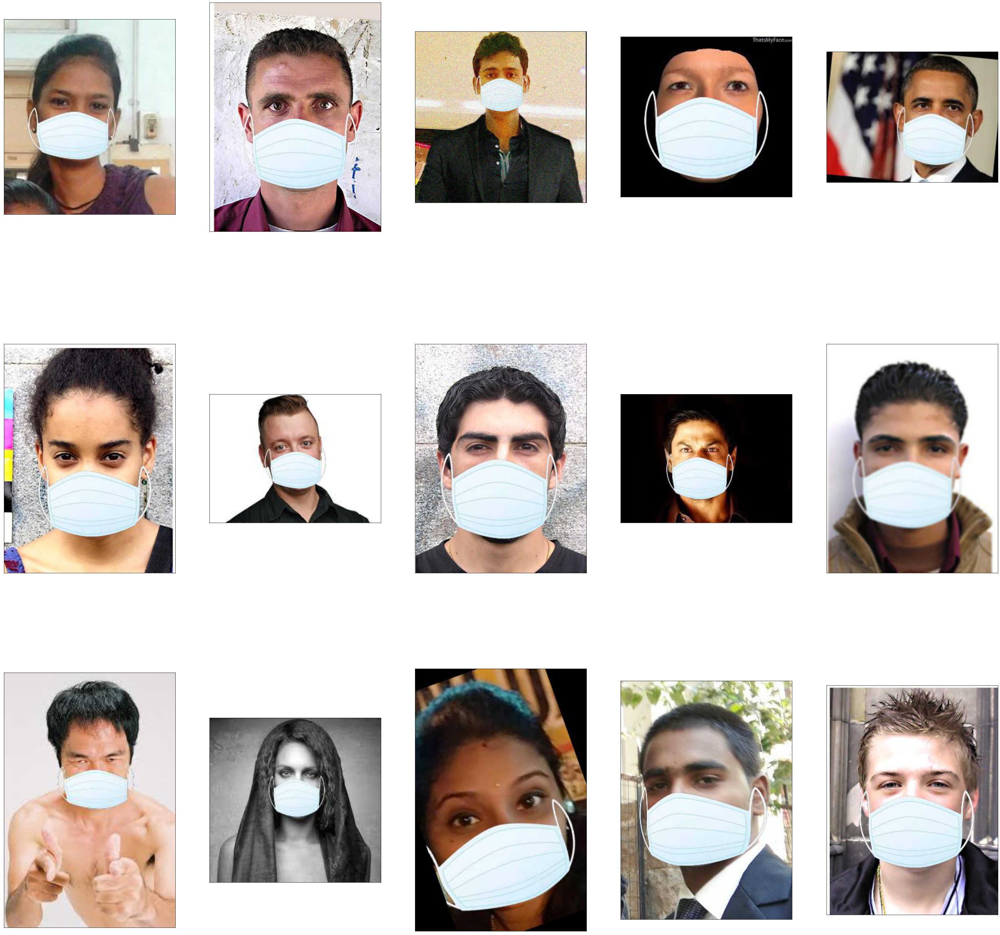

In [ ]:
plt.figure(figsize=(50,50))
counter = 0
for i in os.listdir('data/with_mask'):
  if (counter != 15):
      plt.subplot(3,5,counter+1)
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)
      plt.imshow(img.load_img("data/with_mask/"+i), cmap=plt.cm.binary)
      counter += 1
plt.show()

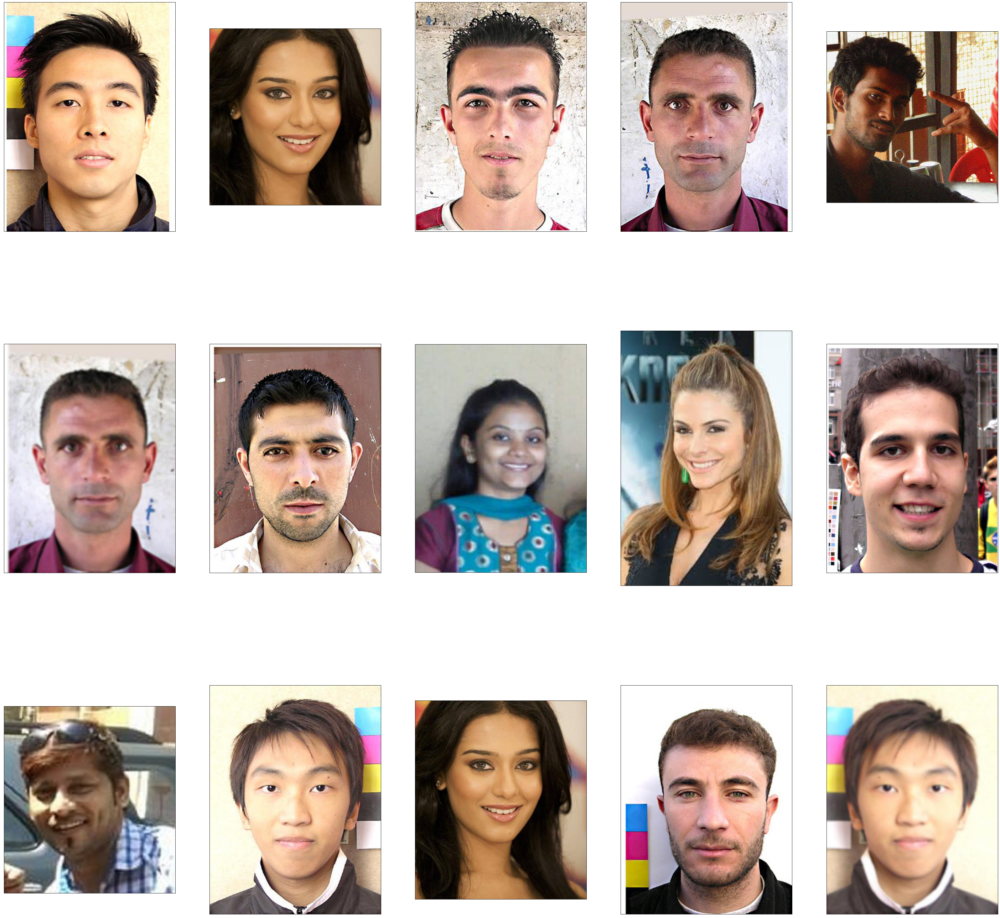

In [ ]:
plt.figure(figsize=(50,50))
counter = 0
for i in os.listdir('data/without_mask'):
  if (counter != 15):
      plt.subplot(3,5,counter+1)
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)
      plt.imshow(img.load_img("data/without_mask/"+i), cmap=plt.cm.binary)
      counter += 1
plt.show()

In [8]:
import tensorflow.keras.backend as k
if k.image_data_format == 'channels_first':
  input_shape = (3,150,150)
else:
  input_shape = (150,150,3)

In [9]:
datagenerator = ImageDataGenerator(rescale=1. /255,shear_range =0.2,zoom_range=0.2,horizontal_flip =True, validation_split=0.2)
train = datagenerator.flow_from_directory('data',classes=["with_mask","without_mask"],class_mode="binary",subset='training',target_size=(150,150))
val = datagenerator.flow_from_directory('data',classes=["with_mask","without_mask"],class_mode="binary",subset='validation',target_size=(150,150))

Found 1101 images belonging to 2 classes.
Found 275 images belonging to 2 classes.


In [ ]:
print(train.class_indices)
print(val.class_indices)

{'with_mask': 0, 'without_mask': 1}
{'with_mask': 0, 'without_mask': 1}


In [62]:
class_names = ['with_mask','without_mask']

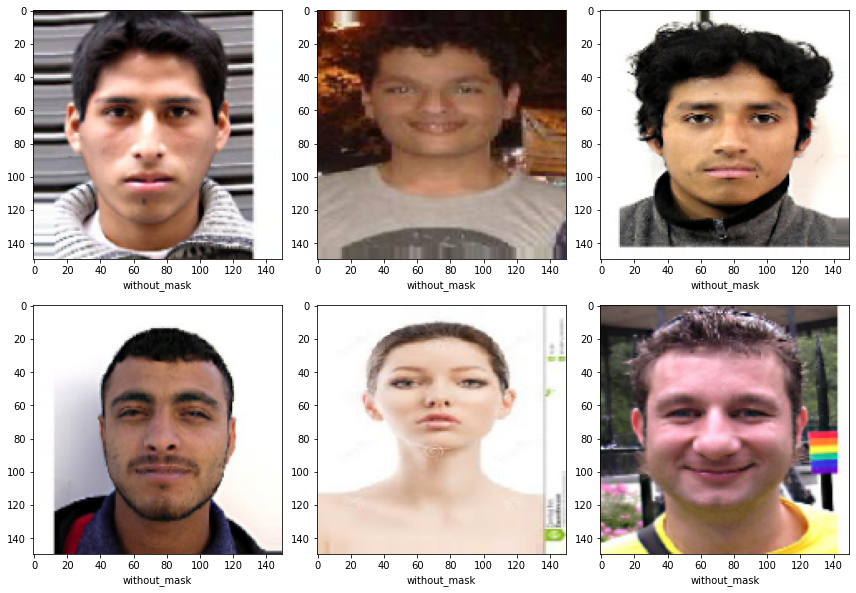

In [ ]:
plt.figure(figsize=(12,12))
for i in range(0, 6):
  plt.subplot(3,3, i + 1)
  plt.imshow(img.array_to_img(train[0][0][i]))
  plt.xlabel(class_names[int(train[0][1][i])])
plt.tight_layout()
plt.show()

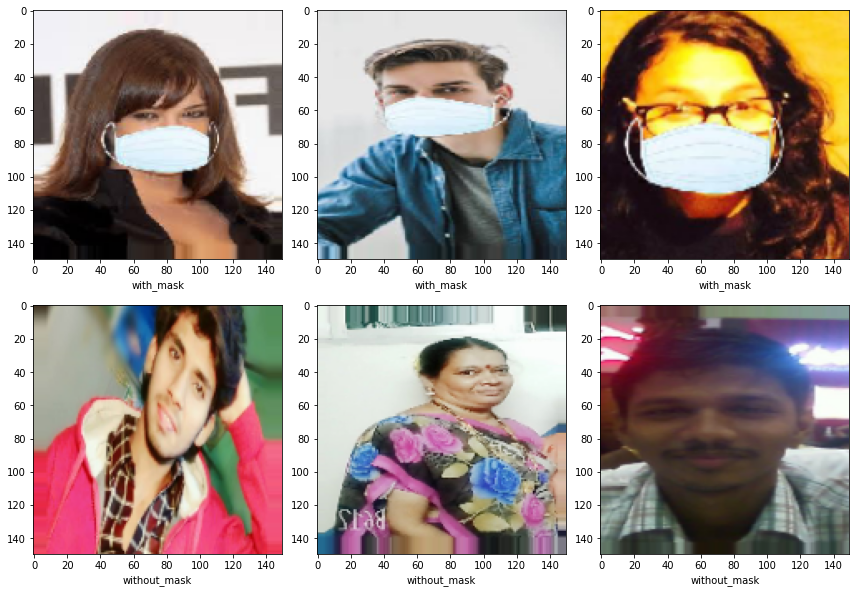

In [ ]:
plt.figure(figsize=(12,12))
for i in range(0, 6):
  plt.subplot(3,3, i + 1)
  plt.imshow(img.array_to_img(val[0][0][i]))
  plt.xlabel(class_names[int(val[0][1][i])])
plt.tight_layout()
plt.show()

In [108]:
model0 = []

In [109]:
model0 = Sequential()

In [110]:
##CONFIGURATION 3
model0.add(Conv2D(2,(3,3),activation='relu',input_shape=input_shape))
model0.add(MaxPooling2D((2,2)))
model0.add(Conv2D(4,(3,3),activation='relu'))
model0.add(MaxPooling2D((2,2)))
model0.add(Conv2D(6,(3,3),activation='relu'))
model0.add(MaxPooling2D((2,2)))
model0.add(Flatten())
model0.add(Dropout(0.5))
#model0.add(Dense(6,activation='relu'))
model0.add(Dense(1,activation='sigmoid'))

In [111]:
model0.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 148, 148, 2)       56        
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 74, 74, 2)         0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 72, 72, 4)         76        
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 36, 36, 4)         0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 34, 34, 6)         222       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 17, 17, 6)         0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 1734)             

In [112]:
model0.compile(optimizer='adam',loss='binary_crossentropy',metrics=["accuracy"])

In [113]:
traininghistory = model0.fit(train,validation_data=val,epochs=10)

Epoch 1/10
35/35 [==============================] - 11s 291ms/step - loss: 0.6922 - accuracy: 0.5033 - val_loss: 0.6609 - val_accuracy: 0.6109
Epoch 2/10
35/35 [==============================] - 10s 279ms/step - loss: 0.6269 - accuracy: 0.7220 - val_loss: 0.3790 - val_accuracy: 0.9091
Epoch 3/10
35/35 [==============================] - 10s 282ms/step - loss: 0.3180 - accuracy: 0.9078 - val_loss: 0.1779 - val_accuracy: 0.9309
Epoch 4/10
35/35 [==============================] - 10s 279ms/step - loss: 0.1886 - accuracy: 0.9273 - val_loss: 0.1349 - val_accuracy: 0.9382
Epoch 5/10
35/35 [==============================] - 10s 281ms/step - loss: 0.1233 - accuracy: 0.9554 - val_loss: 0.1387 - val_accuracy: 0.9491
Epoch 6/10
35/35 [==============================] - 10s 278ms/step - loss: 0.0999 - accuracy: 0.9729 - val_loss: 0.1453 - val_accuracy: 0.9345
Epoch 7/10
35/35 [==============================] - 10s 283ms/step - loss: 0.1060 - accuracy: 0.9710 - val_loss: 0.0978 - val_accuracy: 0.9600

Text(0.5, 1.0, 'Accuracy')

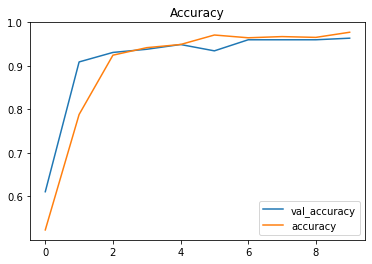

In [114]:
plt.plot(traininghistory.history["val_accuracy"])
plt.plot(traininghistory.history["accuracy"])
plt.legend(['val_accuracy','accuracy'])
plt.title('Accuracy')

Text(0.5, 1.0, 'Loss')

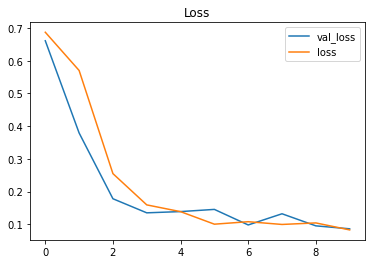

In [115]:
plt.plot(traininghistory.history["val_loss"])
plt.plot(traininghistory.history["loss"])
plt.legend(['val_loss','loss'])
plt.title('Loss')

In [116]:
testdatagenerator = ImageDataGenerator()
test = testdatagenerator.flow_from_directory('test',target_size=(150,150),class_mode='binary',classes=['with_mask','without_mask'])

Found 12 images belonging to 2 classes.


In [117]:
model0.evaluate(test)

1/1 [==============================] - 0s 122ms/step - loss: 235.8043 - accuracy: 0.7500


[235.80426025390625, 0.75]

In [118]:
rslt = model0.predict(test)
print(rslt)

[[0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [1.]
 [1.]
 [0.]]


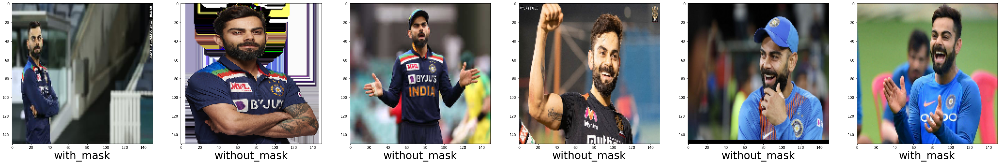

In [119]:
counter = 0
plt.figure(figsize=(50,50))
import numpy as np
for i in os.listdir('test/without_mask'):
  img_pred = img.load_img('test/without_mask/'+i,target_size=(150,150))
  showimage = img_pred
  img_pred = img.img_to_array(img_pred)
  img_pred = np.expand_dims(img_pred,axis=0)
  rslt = model0.predict(img_pred)
  #print(rslt[0][0])
  #if (rslt[0][0] == 1.0):
  plt.subplot(1,6,counter+1)
  plt.imshow(showimage)
  plt.xlabel(class_names[int(rslt[0][0])],fontsize=30)
  counter += 1

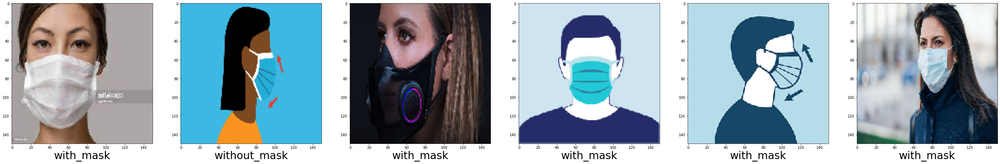

In [120]:
counter = 0
plt.figure(figsize=(50,50))
import numpy as np
for i in os.listdir('test/with_mask'):
  img_pred = img.load_img('test/with_mask/'+i,target_size=(150,150))
  showimage = img_pred
  img_pred = img.img_to_array(img_pred)
  img_pred = np.expand_dims(img_pred,axis=0)
  rslt = model0.predict(img_pred)
  #print(rslt[0][0])
  #if (rslt[0][0] == 1.0):
  plt.subplot(1,6,counter+1)
  plt.imshow(showimage)
  plt.xlabel(class_names[int(rslt[0][0])],fontsize=30)
  counter += 1

In [121]:
model0.save('model_weight.h5')

In [122]:
model0json = model0.to_json()

In [123]:
with open("model0.json","w") as json_file:
    json_file.write(model0json)